<a href="https://colab.research.google.com/github/wonjae124/2021_Lab_project/blob/main/(22_02_13)Gausian_weak_blur_AE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/MyDrive/model
!pwd

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/MyDrive/model
/content/drive/MyDrive/model


In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import random
import torch
import torchvision
from torchsummary import summary
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, random_split
from torch import nn
import torch.optim as optim
from tqdm import tqdm
import skimage.util.noise as noise 
import math
import pytorch_ssim

In [3]:
transform_Guassian_blur_weak = transforms.Compose = ([
      transforms.ToTensor(),
      transforms.GaussianBlur(kernel_size=3, sigma=(0.1))
     
])

origin_tr_dataset = datasets.CIFAR10(root = './data', train=True,
                                  download=True, transform = transforms.ToTensor())

origin_testset = datasets.CIFAR10(root = './data', train=True,
                                  download=True, transform = transforms.ToTensor())

tr_dataset = datasets.CIFAR10(root = './data', train=True, 
                             download = True, transform = transform_Guassian_blur_weak)

test_dataset = datasets.CIFAR10(root = './data', train = False , 
                             download = True, transform = transform_Guassian_blur_weak)

tr_hat_subset, val_hat_subset = torch.utils.data.random_split(tr_dataset, [40000,10000], generator=torch.Generator().manual_seed(1))
tr_subset, val_subset = torch.utils.data.random_split(origin_tr_dataset, [40000,10000], generator=torch.Generator().manual_seed(1))


Files already downloaded and verified
Files already downloaded and verified
Files already downloaded and verified
Files already downloaded and verified


In [4]:
num_workers= 0
batch_size = 256


In [5]:
tr_dataloader = DataLoader(tr_subset, batch_size = batch_size)
tr_hat_dataloader = DataLoader(tr_hat_subset, batch_size = batch_size)
valid_dataloader = DataLoader(val_subset, batch_size = batch_size)
valid_hat_dataloader = DataLoader(val_hat_subset, batch_size = batch_size)

In [6]:
def get_psnr(input, output, max_val=1):

    input = input.cpu().detach().numpy()
    output = output.cpu().detach().numpy()
    img_diff = output - input
    mse = np.mean(img_diff**2)
    
    if mse == 0:
      return 100
    else:
      psnr = 10 * math.log10( (max_val**2)/mse)
      return psnr

In [7]:
len(tr_dataset)

50000

In [8]:
len(test_dataset)

10000

# CIFAR 10은 32X32 이미지이므로 처음부터 다시 인코더 구조를 만들어보자. 오늘도 수고했다.

In [9]:
class Encoder(nn.Module):   

  def __init__(self, encoded_space_dim,fc2_input_dim): 
    super().__init__()

    self.encoder_cnn = nn.Sequential( 
        #필터 사이즈 [channel, height, width] = [3, 3, 3]
        #입력 이미지 3, 32, 32
        nn.Conv2d(in_channels = 3,out_channels = 32, kernel_size = 3, stride = 2, padding = 0),
        nn.BatchNorm2d(32),     
        #32, 15, 15 
        nn.ReLU(True), 

        nn.Conv2d(in_channels = 32,out_channels = 64, kernel_size = 3, stride = 2, padding = 0),
        #64, 7, 7임. 
        nn.BatchNorm2d(64),     
        nn.ReLU(True), 
         
        nn.Conv2d(in_channels = 64,out_channels = 128, kernel_size = 3, stride=2, padding = 0), 
        #128, 3, 3, 
        nn.BatchNorm2d(128), 
        nn.ReLU(True),
    )

    self.flatten = nn.Flatten(start_dim=1) 
    # 128 X 3 X 3 -> 1152

    self.encoder_lin = nn.Sequential( 
        nn.Linear(3*3*128,fc2_input_dim), #1152 -> 128
        nn.ReLU(True),
        nn.Linear(fc2_input_dim, encoded_space_dim) #128->4 
    )

  def forward(self, x): #출력
    x = self.encoder_cnn(x) 
    x = self.flatten(x)
    x = self.encoder_lin(x)
    return x

In [10]:
class Decoder(nn.Module): 
                          
  def __init__(self, encoded_space_dim, fc2_input_dim):
    super().__init__() 
    self.decoder_lin = nn.Sequential( 
        nn.Linear(encoded_space_dim, fc2_input_dim), #4 -> 128
        nn.ReLU(True),
        nn.Linear(fc2_input_dim, 3*3*128), #128 -> 1152 
        nn.ReLU(True)
    )

    self.unflatten = nn.Unflatten(dim=1, unflattened_size=(128,3,3))
     # 1152 -> 128,3,3   필터크기랑 동일. 필터개수 128개 사용 예정

    self.decoder_conv = nn.Sequential(
        nn.ConvTranspose2d(in_channels = 128, out_channels = 64, kernel_size = 3,
        stride=2, padding=0, output_padding = 0),
        nn.BatchNorm2d(64),
        nn.ReLU(True),
        #64,7,7 

        nn.ConvTranspose2d(in_channels = 64, out_channels=32, kernel_size =3,
                           stride=2, padding=0, output_padding = 0),
        nn.BatchNorm2d(32),
        nn.ReLU(True),
        #32,15, 15 

        nn.ConvTranspose2d(in_channels = 32, out_channels=3, kernel_size =3,
                           stride=2, padding=0, output_padding = 1),
        #3, 32, 32
    )
     
  def forward(self, x): 
    x = self.decoder_lin(x)
    x = self.unflatten(x)
    x = self.decoder_conv(x)
    x = torch.sigmoid(x) #마지막에 sigmoid를 넣어서 원래의 이미지(단일 값)으로 복원한다.
    return x  

In [11]:
lr = 0.001
torch.manual_seed(0)
loss_fn=nn.MSELoss() #nn.MSELoss(input,target)이고 tensor간 산술평균 한다.


encoder = Encoder(encoded_space_dim=4, fc2_input_dim = 128)
decoder = Decoder(encoded_space_dim=4, fc2_input_dim = 128)

params= [
    {'params':encoder.parameters()},
    {'params':decoder.parameters()}
]
optim = optim.Adam(params, lr = 0.001, weight_decay = 1e-05)

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

encoder.to(device)
decoder.to(device)

# 모델을 쿠다에 실기 전에 최적화 함수를 세팅 해둬야 한다.

Decoder(
  (decoder_lin): Sequential(
    (0): Linear(in_features=4, out_features=128, bias=True)
    (1): ReLU(inplace=True)
    (2): Linear(in_features=128, out_features=1152, bias=True)
    (3): ReLU(inplace=True)
  )
  (unflatten): Unflatten(dim=1, unflattened_size=(128, 3, 3))
  (decoder_conv): Sequential(
    (0): ConvTranspose2d(128, 64, kernel_size=(3, 3), stride=(2, 2))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(64, 32, kernel_size=(3, 3), stride=(2, 2))
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(32, 3, kernel_size=(3, 3), stride=(2, 2), output_padding=(1, 1))
  )
)

In [12]:
def train(encoder, decoder, device, dataloader, loss_fn, optimizer):
    encoder.train()
    decoder.train()
    train_loss = 0.0

    for img, _ in dataloader:
        origin = img
        origin.to(device)
        Encoded=encoder(origin)
        Decoded=decoder(Encoded)
        loss = loss_fn(Decoded,origin)
        
        optimizer.zero_grad() # 새로운 epoch 때, 이전의 gradient 누적 된 값을 초기화 시키고 학습을 진행한다.
        loss.backward() # 역전파의 기준을 손실함수로 지정한다. backward를 통해서 각 파라미터의 .grad값에 변화도가 저장 된다. 
        optimizer.step() #최적화 실행한다.

        train_loss += loss.cpu().detach().numpy()

    return np.mean(train_loss)

In [19]:
def validation(encoder, decoder, device, dataloader, loss_fn): #validation data
    encoder.eval()
    decoder.eval()
    valid_loss = 0.0

    with torch.no_grad():
        
        for i, img in enumerate(dataloader):
            origin, _ = img
            origin.to(device)
            Encoded = encoder(origin)
            Decoded = decoder(Encoded)
            loss = loss_fn(Decoded, origin)
            valid_loss += loss.cpu().detach().numpy()
        
            for j in range(10):
                ax = plt.subplot(2,10,j+1)
                plt.imshow(origin[j].cpu().squeeze().numpy().transpose(1,2,0))
                ax.get_xaxis().set_visible(False)
                ax.get_yaxis().set_visible(False)

                ax = plt.subplot(2,10,j+10+1)
                plt.imshow(Decoded[j].cpu().squeeze().numpy().transpose(1,2,0))
                ax.get_xaxis().set_visible(False)
                ax.get_yaxis().set_visible(False)
 
                plt.show()

    return valid_loss/len(dataloader)

In [16]:
epochs = 25

history_da = {'train_loss':[],'val_loss':[]}
encoder.to(device)
decoder.to(device)

Decoder(
  (decoder_lin): Sequential(
    (0): Linear(in_features=4, out_features=128, bias=True)
    (1): ReLU(inplace=True)
    (2): Linear(in_features=128, out_features=1152, bias=True)
    (3): ReLU(inplace=True)
  )
  (unflatten): Unflatten(dim=1, unflattened_size=(128, 3, 3))
  (decoder_conv): Sequential(
    (0): ConvTranspose2d(128, 64, kernel_size=(3, 3), stride=(2, 2))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(64, 32, kernel_size=(3, 3), stride=(2, 2))
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(32, 3, kernel_size=(3, 3), stride=(2, 2), output_padding=(1, 1))
  )
)

Epochs 1/25
Epochs 2/25
Epochs 3/25
Epochs 4/25
Epochs 5/25


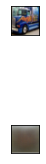

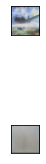

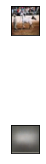

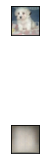

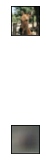

...

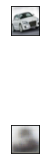

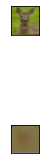

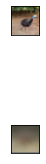

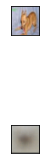

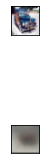


 EPOCH 5/25 	 train loss 4.913 	 val loss 0.031
Epochs 6/25
Epochs 7/25
Epochs 8/25
Epochs 9/25
Epochs 10/25


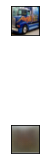

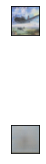

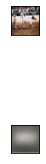

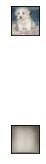

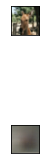

...

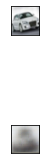

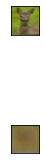

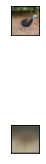

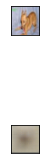

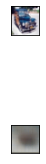


 EPOCH 10/25 	 train loss 4.881 	 val loss 0.031
Epochs 11/25
Epochs 12/25
Epochs 13/25
Epochs 14/25
Epochs 15/25


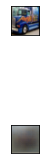

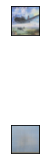

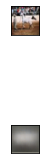

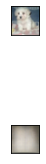

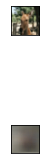

...

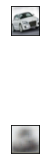

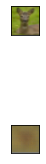

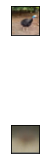

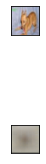

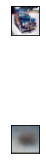


 EPOCH 15/25 	 train loss 4.865 	 val loss 0.031
Epochs 16/25
Epochs 17/25
Epochs 18/25
Epochs 19/25
Epochs 20/25


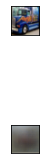

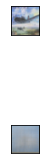

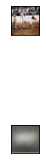

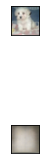

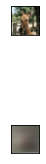

...

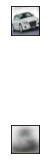

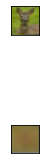

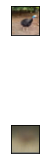

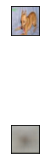

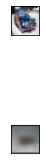


 EPOCH 20/25 	 train loss 4.849 	 val loss 0.031
Epochs 21/25
Epochs 22/25
Epochs 23/25
Epochs 24/25
Epochs 25/25


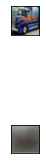

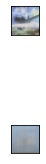

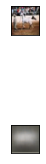

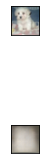

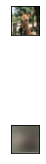

...

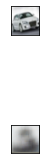

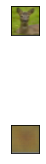

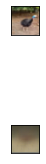

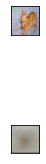

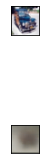


 EPOCH 25/25 	 train loss 4.837 	 val loss 0.031


In [21]:
for i in range(epochs):
    print("Epochs %d/%d" %(i+1,epochs))

    train_loss = train(
                    encoder=encoder,
                    decoder=decoder,
                    device=device,
                    dataloader=tr_dataloader,
                    loss_fn=loss_fn,
                    optimizer=optim)
     
    history_da['train_loss'].append(train_loss) 

    if (i+1)%5 == 0:
            val_loss = validation(
                    encoder=encoder,
                    decoder=decoder,
                    device=device,
                    dataloader=valid_dataloader,
                    loss_fn=loss_fn)
            history_da['val_loss'].append(val_loss)
            print('\n EPOCH {}/{} \t train loss {:.3f} \t val loss {:.3f}'.format(i + 1, epochs, train_loss, val_loss))

    
